# Creating Model

In [ ]:
!pip install mesa
from mesa import Agent, Model
from mesa.time import SimultaneousActivation
from mesa.space import NetworkGrid
from mesa.datacollection import DataCollector

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.5 MB 8.7 MB/s 
     |████████████████████████████████| 596 kB 47.3 MB/s 
     |████████████████████████████████| 64 kB 2.9 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
import networkx as nx
import time, enum, math
import numpy as np
import pandas as pd
import pylab as plt
import random
import panel as pn
import panel.widgets as pnw
pn.extension()

In [ ]:
class State(enum.IntEnum):
    susceptible = 0
    infected = 1
    immune = 2
    exposed = 3

In [ ]:
class MyAgent(Agent):
    """ An agent in an epidemic model."""
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)
        self.state = State.susceptible
        self.infection_time = 0
        self.recovery_time = 0

    def status(self):
        if self.state == State.infected:
            t = self.model.schedule.time-self.infection_time
            if t >= self.recovery_time:
                self.state = State.immune
                return
            self.infect()

    def infect(self):
        neighbors_nodes = self.model.grid.get_neighbors(self.pos, include_center=False)
        susceptible_neighbors = [
            agent
            for agent in self.model.grid.get_cell_list_contents(neighbors_nodes)
            if agent.state is State.susceptible
        ]
        for a in susceptible_neighbors:
            random_float = self.random.random()
            if  random_float < self.model.ptrans:
                a.state = State.exposed

    def step(self):
        self.status()

    def advance(self):
        if self.state == State.exposed:
            self.state = State.infected
            self.recovery_time = self.model.get_recovery_time()
            self.infection_time = self.model.schedule.time


In [ ]:
#@title Create Network
def create_small_world_network(pop,node_degree,beta=0.5):
    g = nx.watts_strogatz_graph(n = pop, k = node_degree, p = beta)
    pos = nx.circular_layout(g)
    return g,pos

def create_random_network(pop,avg_degree,seed=None):
    p_random = avg_degree/pop
    g = nx.erdos_renyi_graph(n=pop, p=p_random,seed=seed)
    pos = nx.kamada_kawai_layout(g)
    return g,pos

def create_lattice(row,col,node_degree,periodic=False):
    if node_degree == 2:
        g,pos = create_small_world_network(row*col,2,beta=0)
        return g,pos

    elif node_degree == 3:
        g = nx.hexagonal_lattice_graph(row,col,periodic=periodic)
        pos = nx.get_node_attributes(g, 'pos')
        return g,pos

    elif node_degree == 4:
        g = nx.grid_2d_graph(row,col)
        pos = dict((n,n) for n in nx.grid_2d_graph(row,col).nodes())
        return g,pos

    elif node_degree == 6:
        g = nx.triangular_lattice_graph(row,col,periodic=periodic)
        pos = nx.get_node_attributes(g, 'pos')
        return g,pos

    elif node_degree == 8:
        g = nx.grid_2d_graph(row,col)
        for i in range(row-1):
            for j in range(col-1):
                g.add_edge((i,j),(i+1,j+1))
                g.add_edge((i,j+1),(i+1,j))
        pos = dict((n,n) for n in nx.grid_2d_graph(row,col).nodes())
        return g,pos
    else:
        raise "Salah degree"

def create_scale_free(pop,m):
    g = nx.barabasi_albert_graph(pop,m)
    pos = nx.kamada_kawai_layout(g)
    return g,pos

### Network model


In [ ]:
class NetworkInfectionModel(Model):
    """A model for infection spread."""

    def __init__(self, graf, pos, ptrans=0.5, infected=2,
                 recovery_days=21,recovery_sd=7,seed=None):

        self.num_nodes = len(graf.nodes())
        self.initial_outbreak_size = infected
        self.recovery_days = recovery_days
        self.recovery_sd = recovery_sd
        self.ptrans = ptrans

        self.G = graf
        self.pos = pos
        self.grid = NetworkGrid(self.G)

        self.schedule = SimultaneousActivation(self)
        self.running = True

        infected_nodes = random.choices(range(0,self.num_nodes) ,k=self.initial_outbreak_size)
        for i, node in enumerate(self.G.nodes()):
            a = MyAgent(i+1, self)
            self.schedule.add(a)
            #add agent
            self.grid.place_agent(a, node)
            #make some agents infected at start
            if i in infected_nodes:
                a.state = State.infected
                a.recovery_time = self.get_recovery_time()
                a.infection_time = self.schedule.time

        self.datacollector = DataCollector(
            agent_reporters={"State": "state"})


    def get_recovery_time(self):
        return int(self.random.normalvariate(self.recovery_days,self.recovery_sd))

    def step(self):
        self.datacollector.collect(self)
        self.schedule.step()

In [ ]:
def get_column_data(model):
    #pivot the model dataframe to get states count at each step
    agent_state = model.datacollector.get_agent_vars_dataframe()
    X = pd.pivot_table(agent_state.reset_index(),index='Step',columns='State',aggfunc=np.size,fill_value=0)
    labels = ['Susceptible','Infected','Removed']
    X.columns = labels[:len(X.columns)]
    return X

def plot_states(model,ax):
    steps = model.schedule.steps
    X = get_column_data(model)
    X.plot(ax=ax,lw=3,alpha=0.8)
    return f

In [ ]:
pop=1000
steps=100
st=time.time()
graf,pos = create_small_world_network(100,4)
model = NetworkInfectionModel(graf,pos)
for i in range(steps):
    model.step()
print (time.time()-st)
agent_state = model.datacollector.get_agent_vars_dataframe()
print (get_column_data(model)[:10])
print(". . .")
print (get_column_data(model)[-10:])

0.0750572681427002
      Susceptible  Infected  Removed
Step                                
0              98         2        0
1              96         4        0
2              92         8        0
3              81        19        0
4              62        38        0
5              34        66        0
6               9        91        0
7               5        95        0
8               0        99        1
9               0        99        1
. . .
      Susceptible  Infected  Removed
Step                                
90              0         0      100
91              0         0      100
92              0         0      100
93              0         0      100
94              0         0      100
95              0         0      100
96              0         0      100
97              0         0      100
98              0         0      100
99              0         0      100


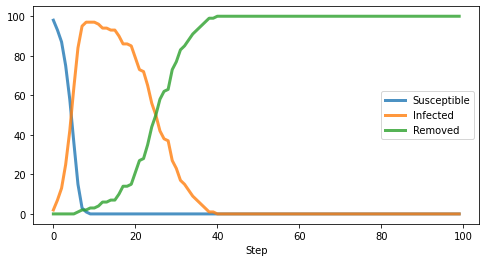

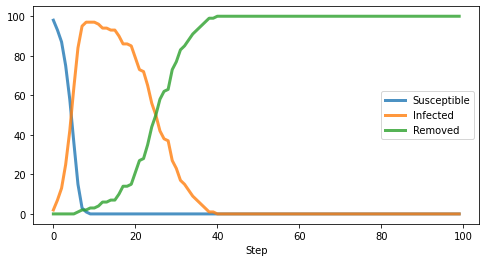

In [ ]:
f,ax=plt.subplots(1,1,figsize=(8,4))
plot_states(model,ax)

In [ ]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
cmap = ListedColormap(["lightblue", "orange", "green",])

def plot_grid(model,fig,title=''):
    graph = model.G
    pos = model.pos
    plt.clf()
    ax=fig.add_subplot()
    states = [int(i.state) for i in model.grid.get_all_cell_contents()]

    colors = [cmap(i) for i in states]

    nx.draw(graph, pos, node_size=80, edge_color='gray', node_color=colors, #with_labels=True,
            alpha=0.9,font_size=14,ax=ax)

    ax.set_title(title)
    return


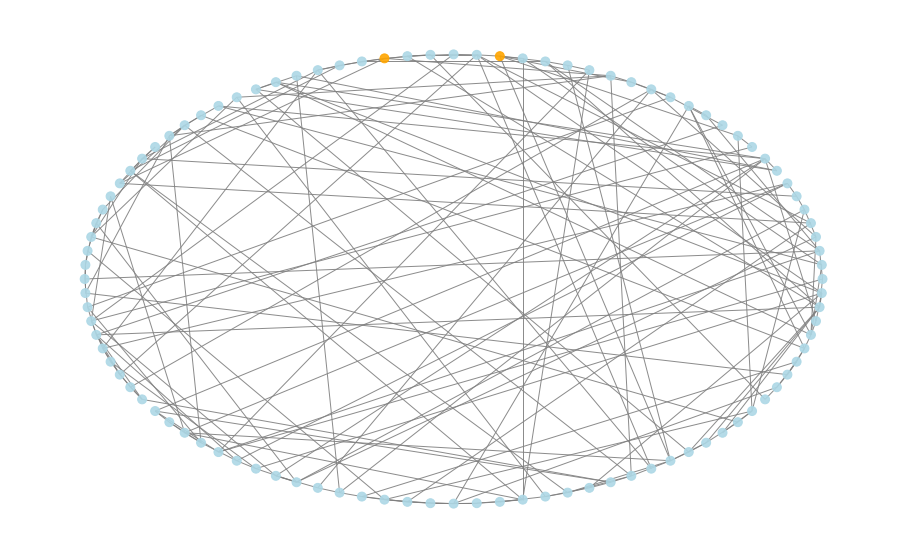

In [ ]:
fig,ax=plt.subplots(1,1,figsize=(16,10))
graf,pos = create_small_world_network(100,4)
model = NetworkInfectionModel(graf,pos)
plot_grid(model,fig)

In [ ]:
def run_model(pop, ptrans, degree, beta, steps, delay,infected):

    model = NetworkInfectionModel(pop, ptrans=ptrans, node_degree=degree, beta=beta, infected=infected)

    fig1 = plt.Figure(figsize=(7,7))
    grid_pane.object = fig1
    fig2 = plt.Figure(figsize=(7,7))
    ax2=fig2.add_subplot(1,1,1,label='b')
    states_pane.object = fig2

    for i in range(steps):
        model.step()
        plot_grid(model,fig1,title='step=%s' %i)
        grid_pane.param.trigger('object')
        ax2.clear()
        plot_states(model,ax2)
        ax2.set_xlim(0,steps)
        states_pane.param.trigger('object')
        time.sleep(delay)

In [ ]:
import warnings
warnings.filterwarnings('ignore')
grid_pane = pn.pane.Matplotlib()
states_pane = pn.pane.Matplotlib()

go_btn = pnw.Button(name='run',width=100,button_type='primary')
pop_input = pnw.IntSlider(name='population',value=100,start=10,end=1000,step=10,width=100)
degree_input = pnw.IntSlider(name='node degree',value=4,start=2,end=10,step=2,width=100)
beta_input = pnw.FloatSlider(name='beta',value=0.5,start=0,end=1,step=0.1,width=100)
ptrans_input = pnw.FloatSlider(name='prob. trans',value=0.1,width=100)
steps_input = pnw.IntSlider(name='steps',value=20,start=5,end=100,width=100)
delay_input = pnw.FloatSlider(name='delay',value=.2,start=0,end=3,step=.2,width=100)
infected_input = pnw.IntSlider(name='infected',value=5,start=1,end=100,step=1,width=100)
widgets = pn.WidgetBox(go_btn,pop_input,degree_input,beta_input,ptrans_input,steps_input,delay_input,infected_input)

def execute(event):
    run_model(pop_input.value, ptrans_input.value, degree_input.value, beta_input.value, steps_input.value, delay_input.value,infected_input.value)
go_btn.param.watch(execute, 'clicks')

pn.Row("haa",pn.Column(widgets),grid_pane,states_pane,sizing_mode='stretch_width')

Row(sizing_mode='stretch_width')
    [0] Markdown(str)
    [1] Column
        [0] WidgetBox
            [0] Button(button_type='primary', name='run', width=100)
            [1] IntSlider(end=1000, name='population', start=10, step=10, value=100, width=100)
            [2] IntSlider(end=10, name='node degree', start=2, step=2, value=4, width=100)
            [3] FloatSlider(name='beta', value=0.5, width=100)
            [4] FloatSlider(name='prob. trans', value=0.1, width=100)
            [5] IntSlider(end=100, name='steps', start=5, value=20, width=100)
            [6] FloatSlider(end=3, name='delay', step=0.2, value=0.2, width=100)
            [7] IntSlider(end=100, name='infected', start=1, value=5, width=100)
    [2] Matplotlib(None)
    [3] Matplotlib(None)

# Bentuk Network

In [ ]:
def plot_network(graf,pos,ax,title=''):
    nx.draw(graf, pos, node_size=80, edge_color='gray', node_color="lightblue",
            alpha=0.9,font_size=100,ax=ax)
    ax.set_title(title,fontsize=30)
    return


In [ ]:
def plot_n_model_in_axis(graph,pos,inf_rate,ax,only_avg=False):
    for j in range(100):
        model = NetworkInfectionModel(graph,pos,inf_rate)
        for k in range(200):
            model.step()
        df = get_column_data(model)
        if j == 0:
            s = df["Susceptible"]
            i = df["Infected"]
            r = df["Removed"]
        else:
            s += df["Susceptible"]
            i += df["Infected"]
            r += df["Removed"]
        if only_avg == False:
            df["Susceptible"].plot(c='lightblue',figsize=(32,16),ax=ax)
            df["Infected"].plot(c='lightcoral',figsize=(32,16),ax=ax)
            df["Removed"].plot(c='lightgreen',figsize=(32,16),ax=ax)
    s=s/100
    i=i/100
    r=r/100
    s.plot(c='darkblue',figsize=(32,16),ax=ax)
    i.plot(c='darkred',figsize=(32,16),ax=ax)
    r.plot(c='darkgreen',figsize=(32,16),ax=ax)

def plot_tabel_k_vs_inf_rate_lattice(param,list_inf_rate,only_avg=False):
    row,col,list_k = [],[],[]
    for r,c,k in param:
        row.append(r);col.append(c);list_k.append(k)
    l_k = len(list_k)
    l_ir = len(list_inf_rate)
    fig,axes=plt.subplots(l_k,l_ir,figsize=(30*l_ir+10,15*l_k))
    for k in range(l_k):
        for ir in range(l_ir):
            if k == 0:
                axes[k][ir].set_title(f'Inf_rate={list_inf_rate[ir]}',fontsize=20)
            if ir == 0:
                axes[k][ir].set_ylabel(f'k={list_k[k]}',fontsize=20)

            graf,pos = create_lattice(row[k],col[k],list_k[k])
            plot_n_model_in_axis(graf,pos,list_inf_rate[ir],axes[k][ir],only_avg)
    # return fig



In [ ]:

def plot_table_k_vs_inf_rate(n,create_network,list_k,list_inf_rate,only_avg=False):
    l_k = len(list_k)
    l_ir = len(list_inf_rate)
    fig,axes=plt.subplots(l_k,l_ir,figsize=(30*l_ir+10,15*l_k))
    for k in range(l_k):
        for ir in range(l_ir):
            if k == 0:
                axes[k][ir].set_title(f'Inf_rate={list_inf_rate[ir]}',fontsize=20)
            if ir == 0:
                axes[k][ir].set_ylabel(f'k={list_k[k]}',fontsize=20)
            graf,pos = create_network(n,list_k[k])
            plot_n_model_in_axis(graf,pos,list_inf_rate[ir],axes[k][ir],only_avg)
    # return fig



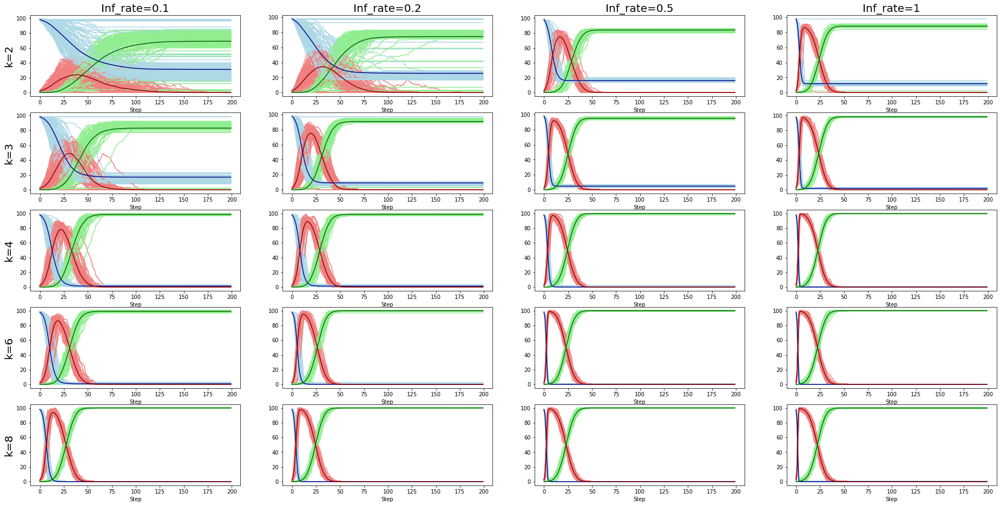

In [ ]:
#@title Random Network Table n=100
k = [2,3,4,6,8]
inf_rate = [0.1,0.2,0.5,1]
plot_table_k_vs_inf_rate(100,create_random_network,k,inf_rate)


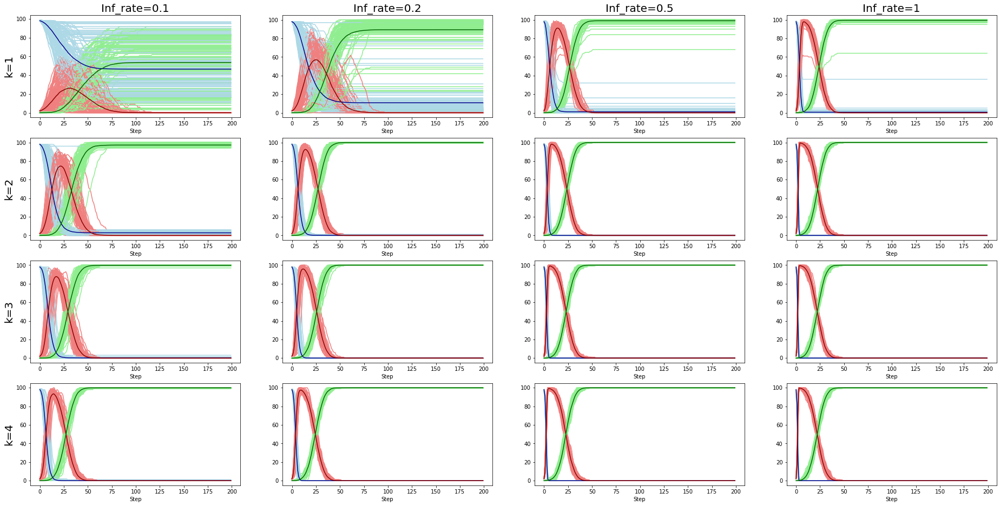

In [ ]:
#@title Scale Free Table n=100
k = [1,2,3,4]
inf_rate = [0.1,0.2,0.5,1]
plot_table_k_vs_inf_rate(100,create_scale_free,k,inf_rate)

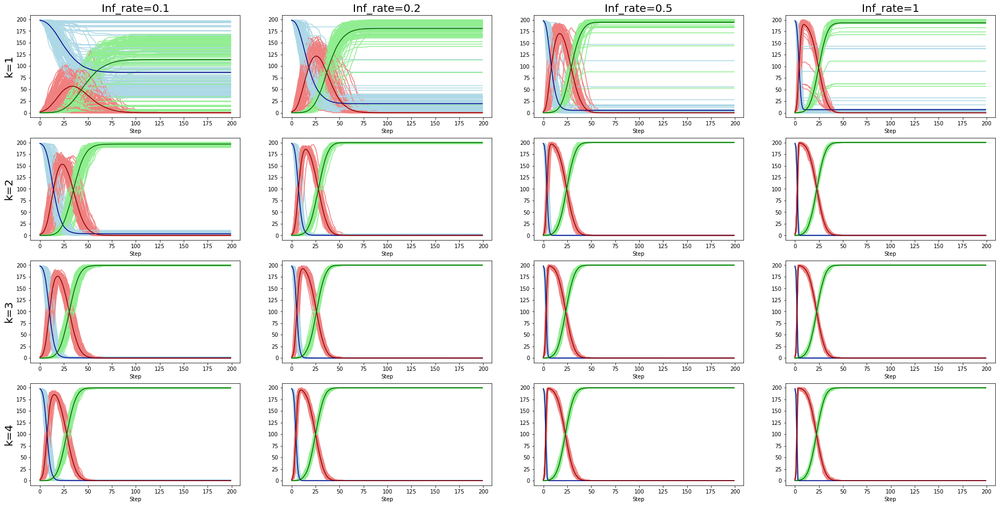

In [ ]:
#@title Scale Free Table n=100
k = [1,2,3,4]
inf_rate = [0.1,0.2,0.5,1]
plot_table_k_vs_inf_rate(200,create_scale_free,k,inf_rate)

In [ ]:
#@title Random Network Table n=200
k = [2,3,4,6,8]
inf_rate = [0.1,0.2,0.5,1]
plot_table_k_vs_inf_rate(200,create_random_network,k,inf_rate)

NameError: ignored

In [ ]:
#@title Small World Network Table n=100
k = [2,4,6,8]
inf_rate = [0.1,0.2,0.5,1]
plot_table_k_vs_inf_rate(100,create_small_world_network,k,inf_rate)


In [ ]:
#@title Small World Network Table n=200
k = [2,4,6,8]
inf_rate = [0.1,0.2,0.5,1]
plot_table_k_vs_inf_rate(200,create_small_world_network,k,inf_rate)

NameError: ignored

[2, 3, 4, 6, 8]


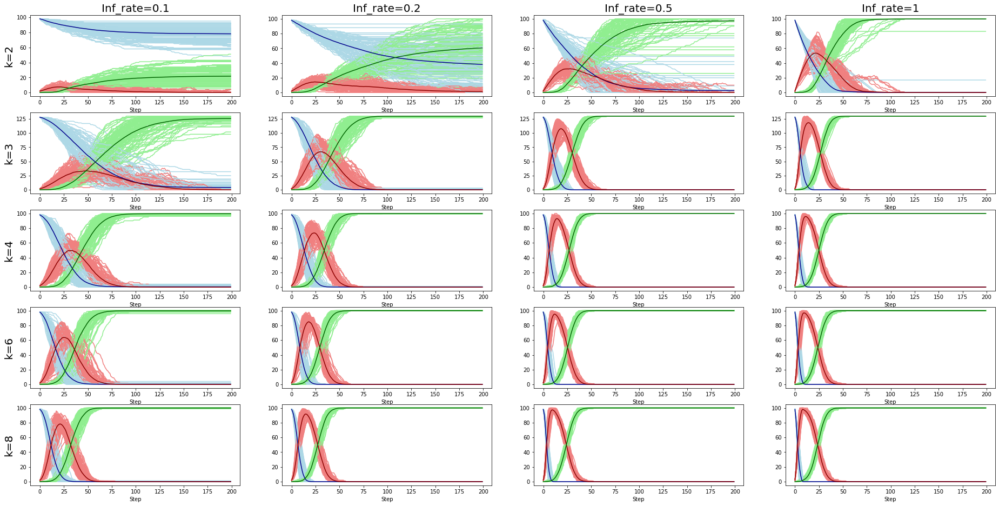

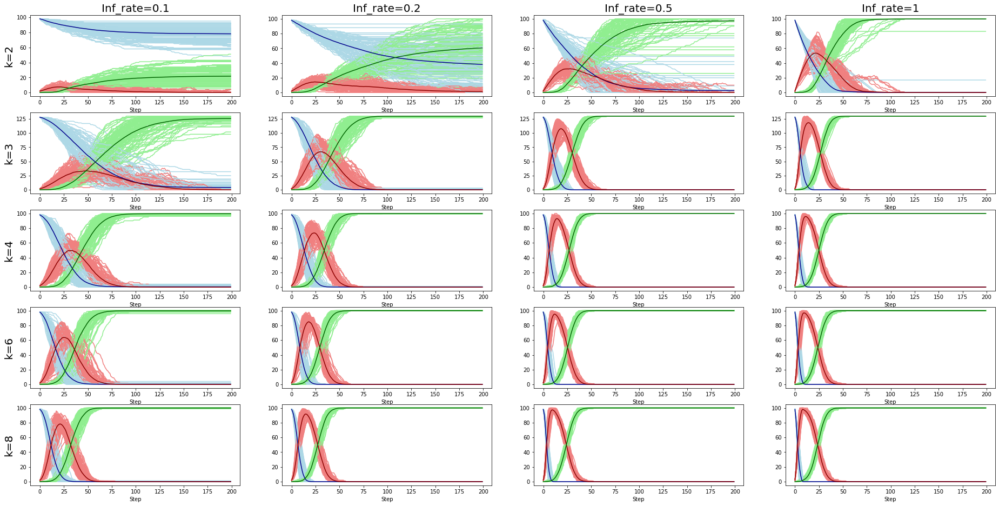

In [ ]:
param = [(10,10,2),
         (5,10,3),
         (10,10,4),
         (9,18,6),
         (10,10,8)]
list_inf_rate = [0.1,0.2,0.5,1]
plot_tabel_k_vs_inf_rate_lattice(param,list_inf_rate,only_avg=False)


[2, 3, 4, 6, 8]


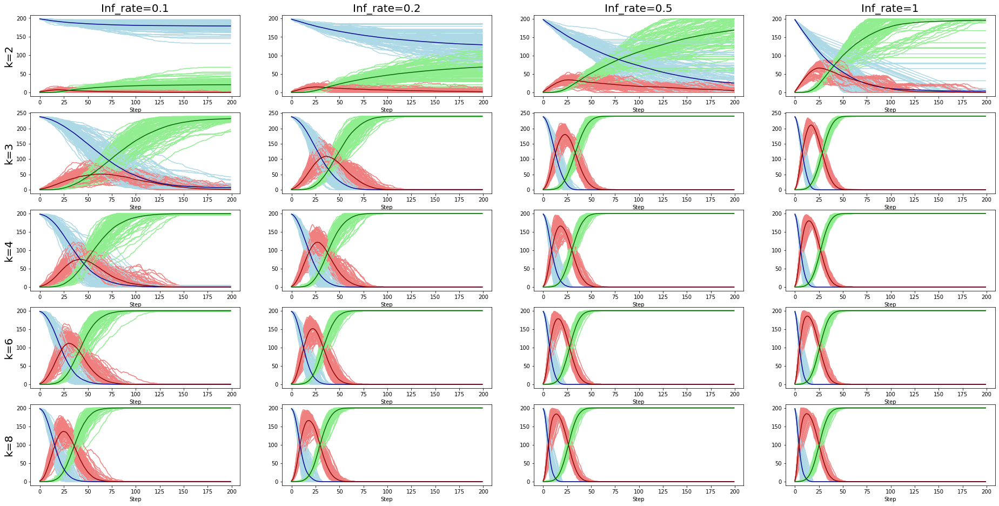

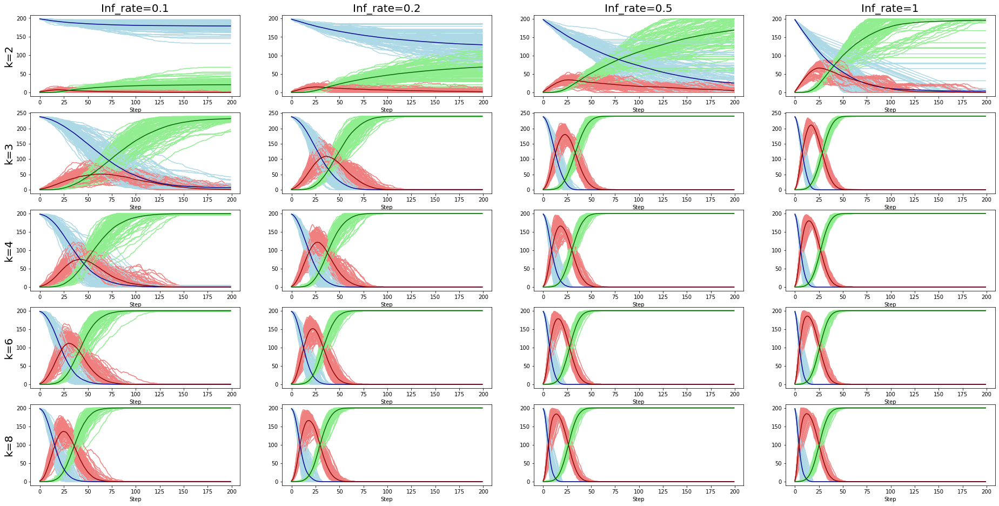

In [ ]:
param = [(10,20,2),
         (10,10,3),
         (10,20,4),
         (19,18,6),
         (10,20,8)]
list_inf_rate = [0.1,0.2,0.5,1]
plot_tabel_k_vs_inf_rate_lattice(param,list_inf_rate,only_avg=False)


In [ ]:
def plot_tabel_k_vs_inf_rate(list_k,list_inf_rate,model,only_avg=False):
    l_k = len(list_k)
    l_ir = len(list_inf_rate)
    fig,axes=plt.subplots(l_k,l_ir,figsize=(30*l_ir+10,15*l_k))
    for k in range(l_k):
        for ir in range(l_ir):
            if k == 0:
                axes[k][ir].set_title(f'Inf_rate={list_inf_rate[ir]}',fontsize=20)
            if ir == 0:
                axes[k][ir].set_ylabel(f'k={list_k[k]}',fontsize=20)
            plot_n_model_in_axis(model,list_inf_rate[ir],list_k[k],axes[k][ir],only_avg)
    return fig

In [ ]:
fig,axes=plt.subplots(5,4,figsize=(30*5+10,15*4))
n = 100
k = [2,3,4,6,8]
inf_rate = [0.1,0.2,0.5,1]
# plot_n_model_in_axis(n,inf_rate[0],k[0],axes[0][0],only_avg=True)
# plot_n_model_in_axis(n,inf_rate[0],k[1],axes[1][0],only_avg=True)
fig.suptitle("Random Network - 100 nodes",fontsize=30)
for i in range(5):
    for j in range(4):
        if i == 0:
            axes[i][j].set_title(f'Inf_rate={inf_rate[j]}',fontsize=20)
        if j == 0:
            axes[i][j].set_ylabel(f'k={k[i]}',fontsize=20)
        plot_n_model_in_axis(n,inf_rate[j],k[i],axes[i][j],only_avg=False)



### coba scalefree

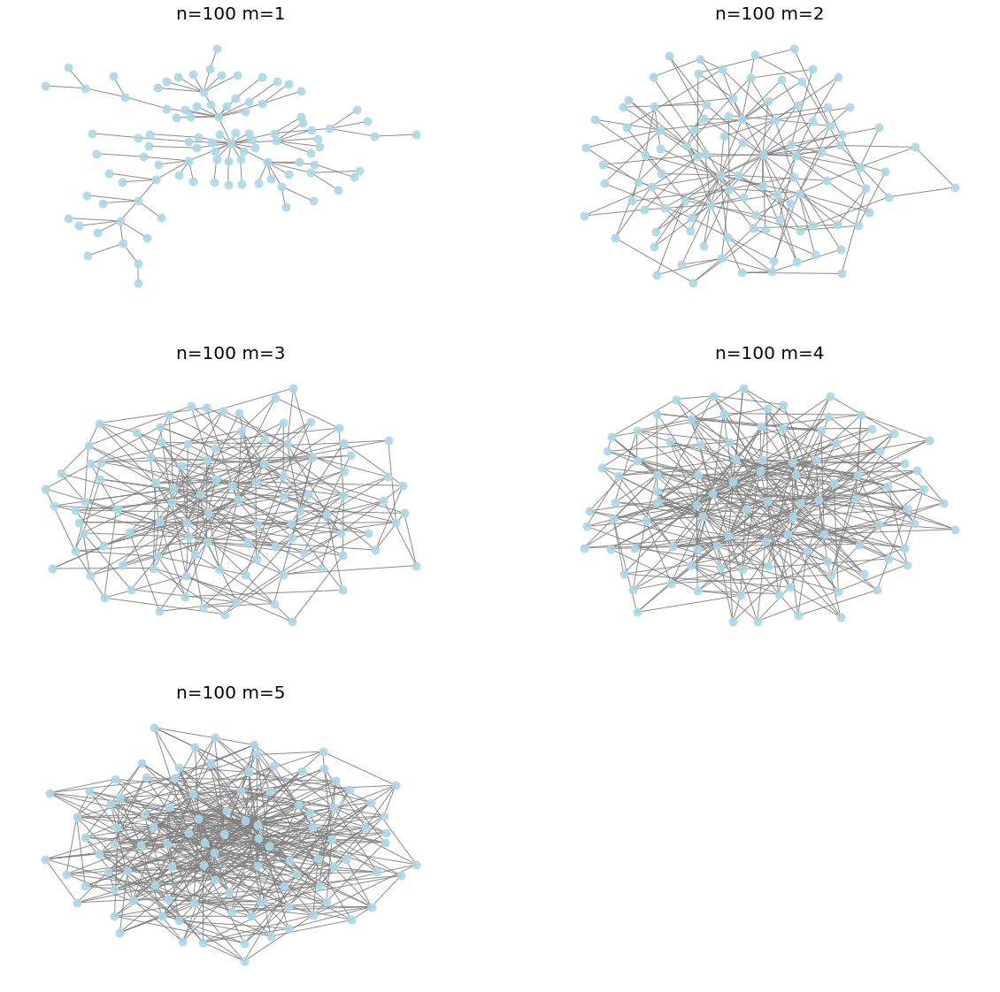

In [ ]:

fig,ax=plt.subplots(3,2,figsize=(20,20))
ax[2][1].axis('off')

graf,pos = create_scale_free(100,1)
plot_network(graf,pos,ax[0][0],"n=100 m=1")
graf,pos = create_scale_free(100,2)
plot_network(graf,pos,ax[0][1],"n=100 m=2")
graf,pos = create_scale_free(100,3)
plot_network(graf,pos,ax[1][0],"n=100 m=3")
graf,pos = create_scale_free(100,4)
plot_network(graf,pos,ax[1][1],"n=100 m=4")
graf,pos = create_scale_free(100,5)
plot_network(graf,pos,ax[2][0],"n=100 m=5")


### Coba Random Network

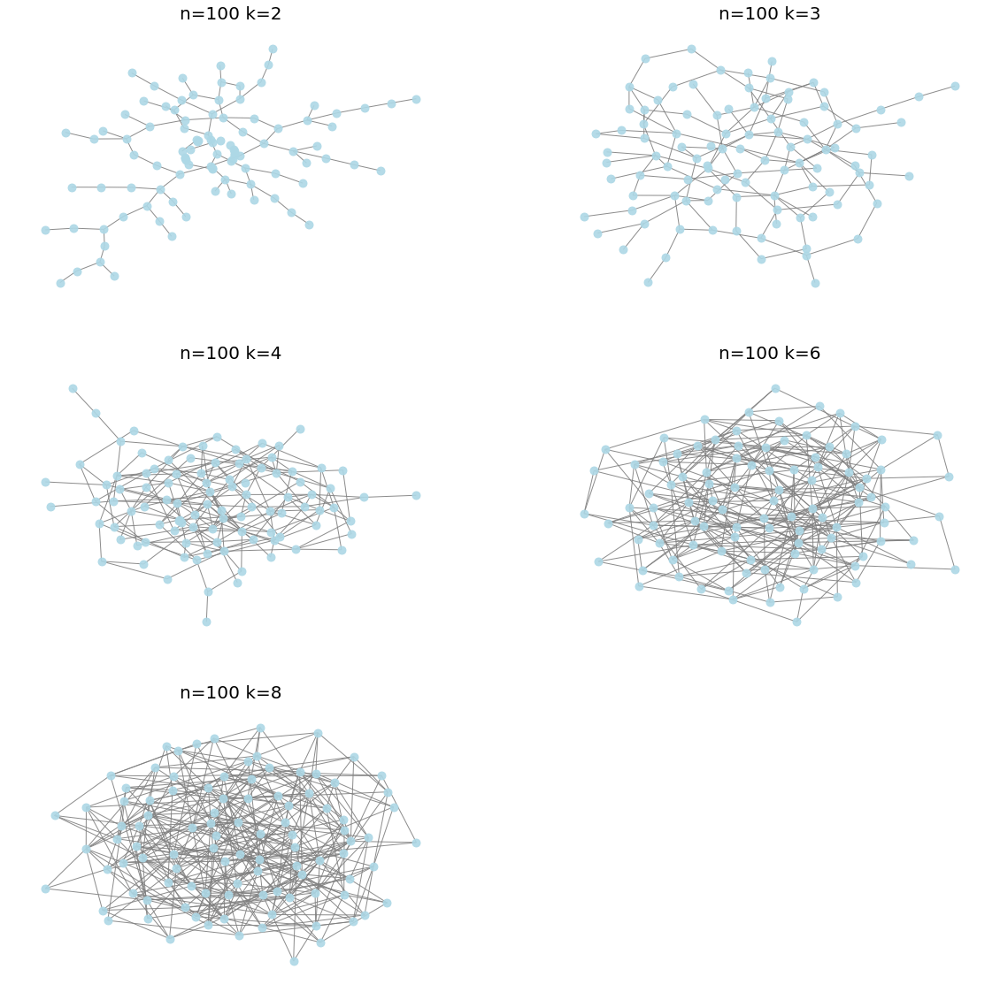

In [ ]:
def plot_network(graf,pos,ax,title=''):
    nx.draw(graf, pos, node_size=80, edge_color='gray', node_color="lightblue",
            alpha=0.9,font_size=100,ax=ax)
    ax.set_title(title,fontsize=20)
    return

fig,ax=plt.subplots(3,2,figsize=(20,20))
ax[2][1].axis('off')

graf,pos = create_random_network(100,2)
plot_network(graf,pos,ax[0][0],"n=100 k=2")
graf,pos = create_random_network(100,3)
plot_network(graf,pos,ax[0][1],"n=100 k=3")
graf,pos = create_random_network(100,4)
plot_network(graf,pos,ax[1][0],"n=100 k=4")
graf,pos = create_random_network(100,6)
plot_network(graf,pos,ax[1][1],"n=100 k=6")
graf,pos = create_random_network(100,8)
plot_network(graf,pos,ax[2][0],"n=100 k=8")


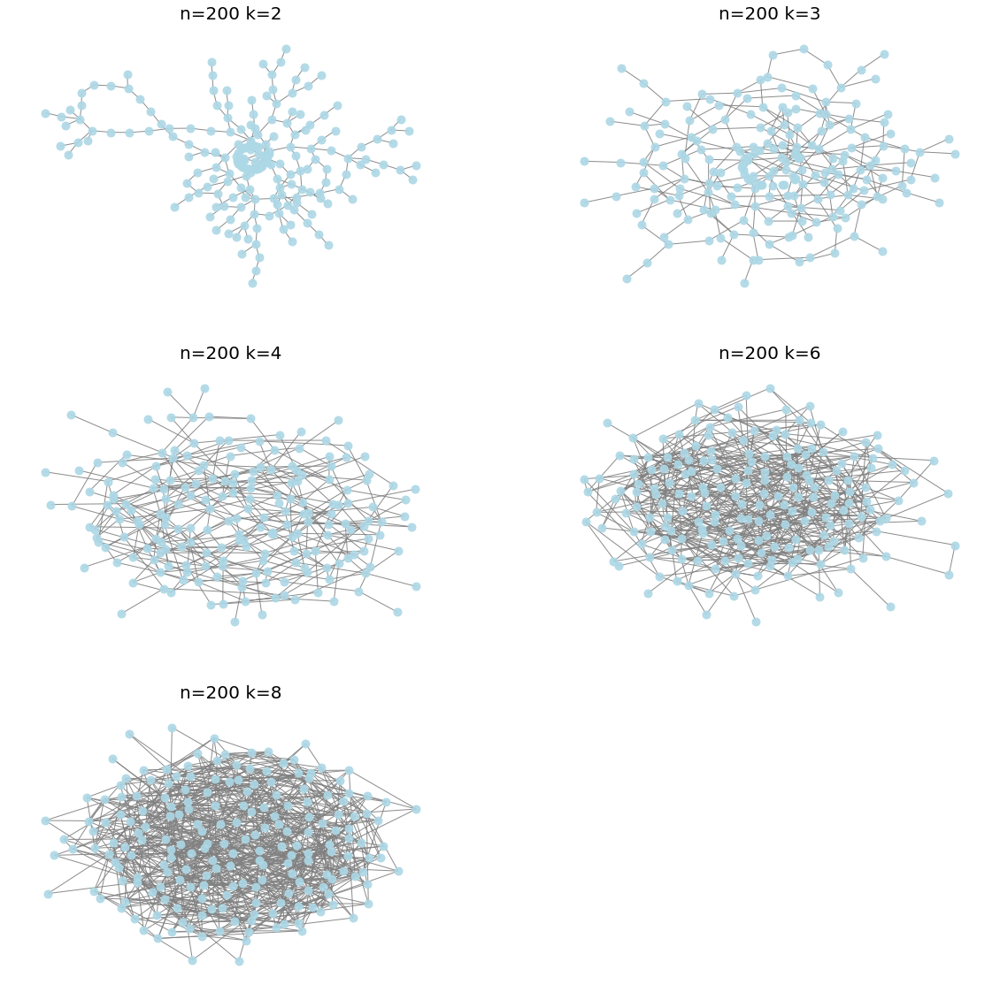

In [ ]:
fig,ax=plt.subplots(3,2,figsize=(20,20))
ax[2][1].axis('off')

graf,pos = create_random_network(200,2)
plot_network(graf,pos,ax[0][0],"n=200 k=2")
graf,pos = create_random_network(200,3)
plot_network(graf,pos,ax[0][1],"n=200 k=3")
graf,pos = create_random_network(200,4)
plot_network(graf,pos,ax[1][0],"n=200 k=4")
graf,pos = create_random_network(200,6)
plot_network(graf,pos,ax[1][1],"n=200 k=6")
graf,pos = create_random_network(200,8)
plot_network(graf,pos,ax[2][0],"n=200 k=8")


### Coba Small World

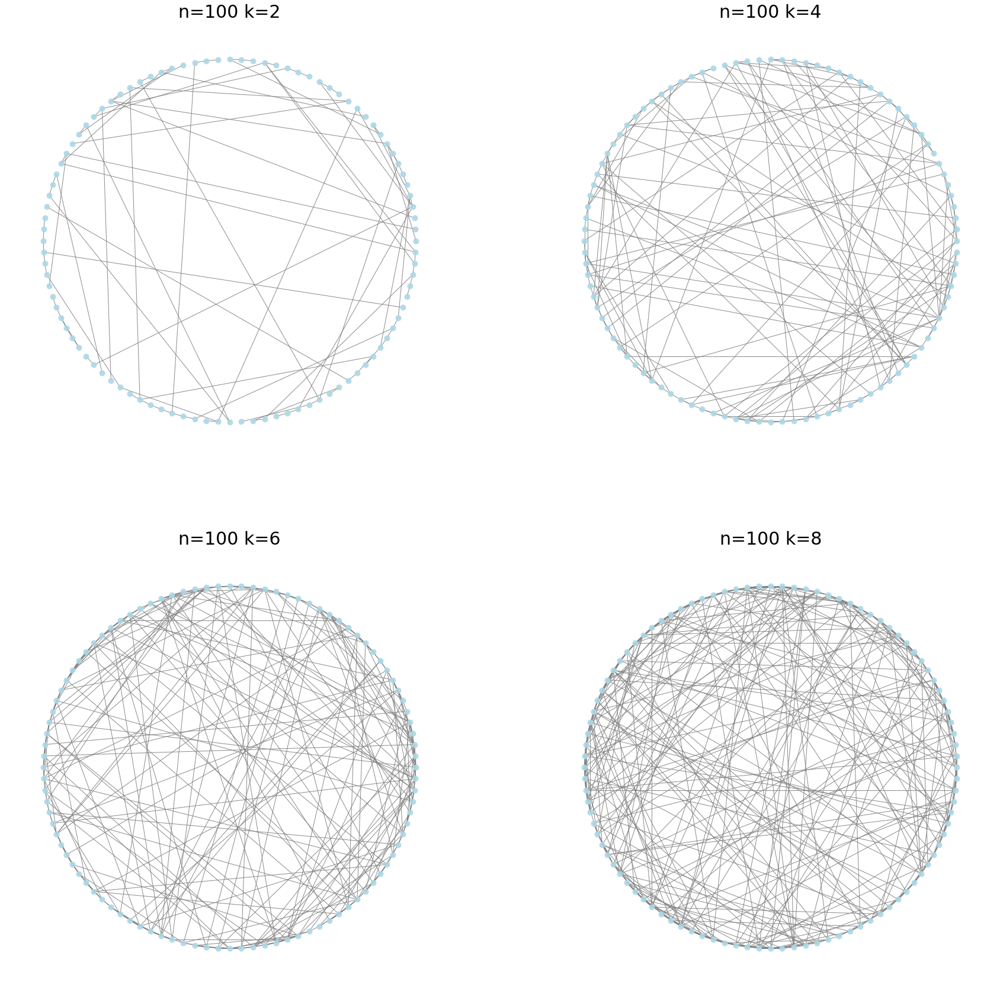

In [ ]:
fig,ax=plt.subplots(2,2,figsize=(30,30))

graf,pos = create_small_world_network(100,2)
plot_network(graf,pos,ax[0][0],"n=100 k=2")
graf,pos = create_small_world_network(100,4)
plot_network(graf,pos,ax[0][1],"n=100 k=4")
graf,pos = create_small_world_network(100,6)
plot_network(graf,pos,ax[1][0],"n=100 k=6")
graf,pos = create_small_world_network(100,8)
plot_network(graf,pos,ax[1][1],"n=100 k=8")


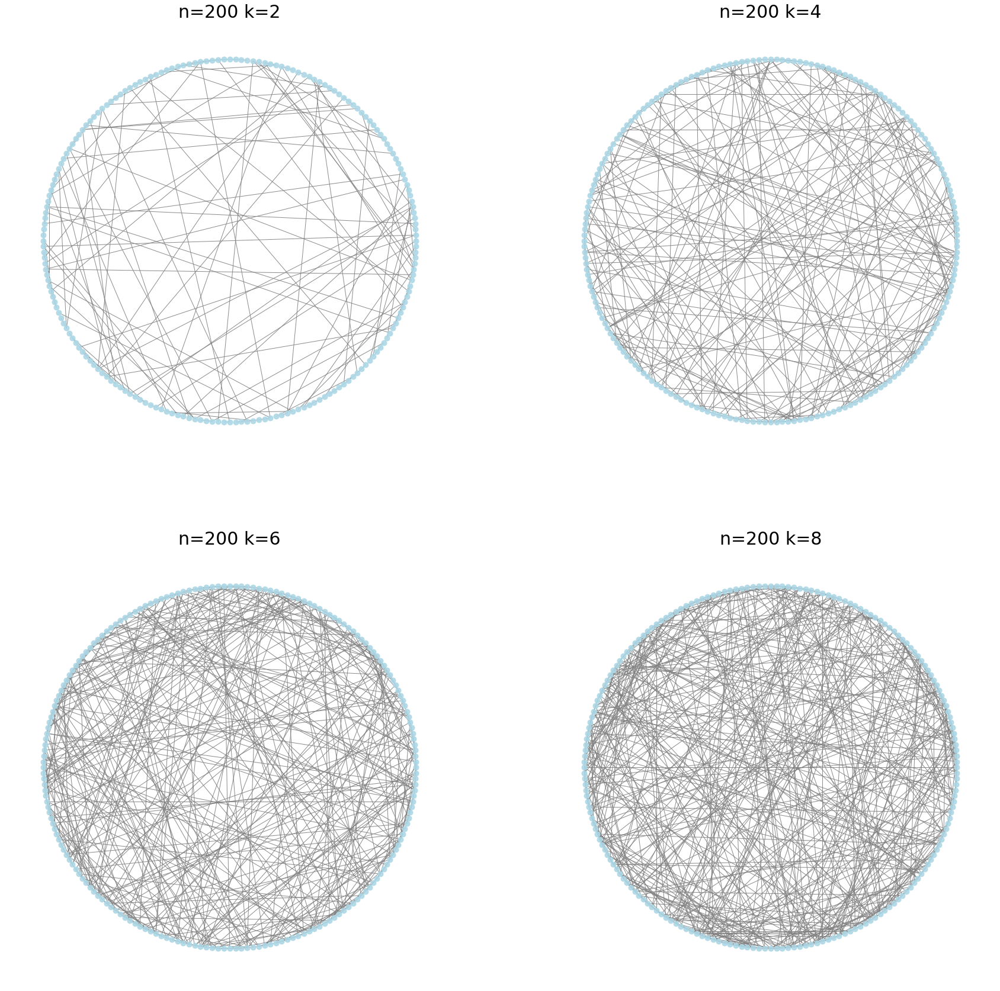

In [ ]:
fig,ax=plt.subplots(2,2,figsize=(30,30))

graf,pos = create_small_world_network(200,2)
plot_network(graf,pos,ax[0][0],"n=200 k=2")
graf,pos = create_small_world_network(200,4)
plot_network(graf,pos,ax[0][1],"n=200 k=4")
graf,pos = create_small_world_network(200,6)
plot_network(graf,pos,ax[1][0],"n=200 k=6")
graf,pos = create_small_world_network(200,8)
plot_network(graf,pos,ax[1][1],"n=200 k=8")


### coba lattice

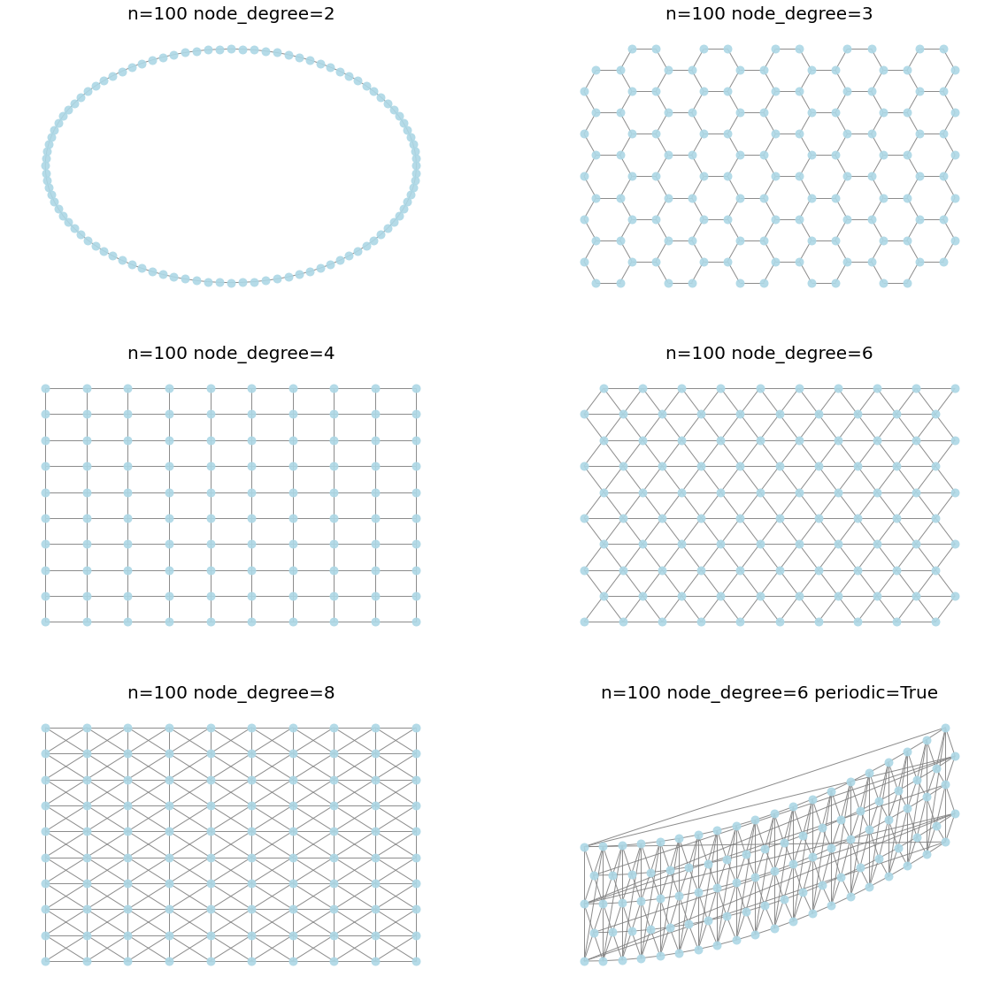

In [ ]:
def plot_network(graf,pos,ax,title=''):
    nx.draw(graf, pos, node_size=80, edge_color='gray', node_color="lightblue",
            alpha=0.9,font_size=100,ax=ax)
    ax.set_title(title,fontsize=20)
    return

fig,ax=plt.subplots(3,2,figsize=(20,20))
ax[2][1].axis('off')

graf,pos = create_lattice(10,10,2)
plot_network(graf,pos,ax[0][0],"n=100 node_degree=2")
graf,pos = create_lattice(5,10,3)
plot_network(graf,pos,ax[0][1],"n=100 node_degree=3")
graf,pos = create_lattice(10,10,4)
plot_network(graf,pos,ax[1][0],"n=100 node_degree=4")
graf,pos = create_lattice(9,18,6)
plot_network(graf,pos,ax[1][1],"n=100 node_degree=6")
graf,pos = create_lattice(10,10,8)
plot_network(graf,pos,ax[2][0],"n=100 node_degree=8")
graf,pos = create_lattice(5,39,6,periodic=True)
plot_network(graf,pos,ax[2][1],"n=100 node_degree=6 periodic=True")


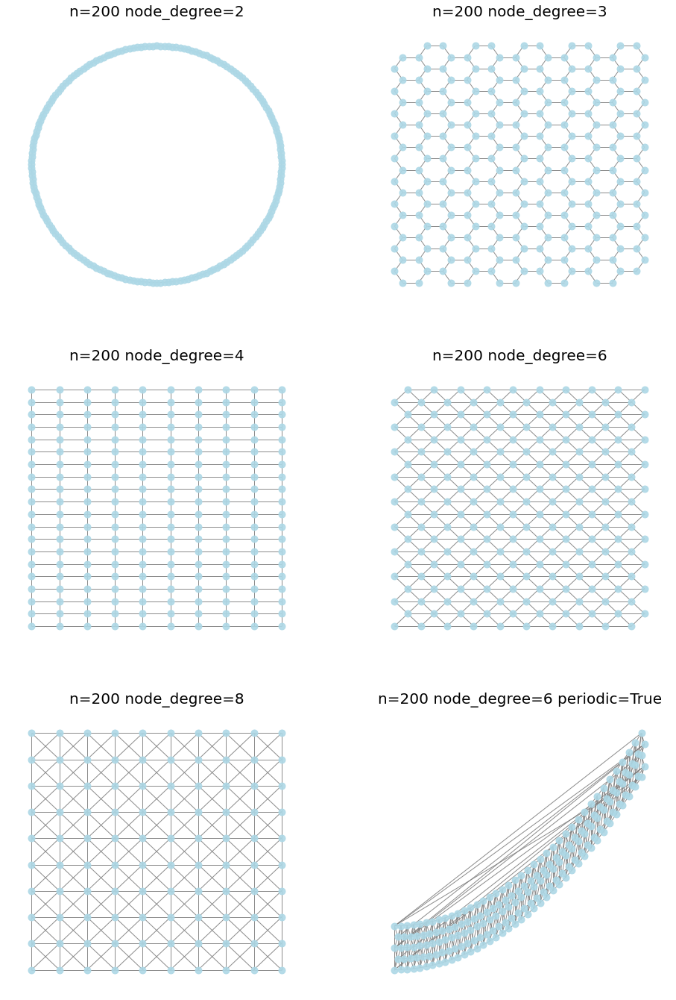

In [ ]:
def plot_network(graf,pos,ax,title=''):
    nx.draw(graf, pos, node_size=80, edge_color='gray', node_color="lightblue",
            alpha=0.9,font_size=14,ax=ax)
    ax.set_title(title,fontsize=20)
    return

fig,ax=plt.subplots(3,2,figsize=(2*8,3*8))
ax[2][1].axis('off')

graf,pos = create_lattice(10,20,2)
plot_network(graf,pos,ax[0][0],"n=200 node_degree=2")
graf,pos = create_lattice(10,10,3)
plot_network(graf,pos,ax[0][1],"n=200 node_degree=3")
graf,pos = create_lattice(10,20,4)
plot_network(graf,pos,ax[1][0],"n=200 node_degree=4")
graf,pos = create_lattice(19,18,6)
plot_network(graf,pos,ax[1][1],"n=200 node_degree=6")
graf,pos = create_lattice(10,10,8)
plot_network(graf,pos,ax[2][0],"n=200 node_degree=8")
graf,pos = create_lattice(5,79,6,periodic=True)
plot_network(graf,pos,ax[2][1],"n=200 node_degree=6 periodic=True")

#### Coba" 6 degree

100


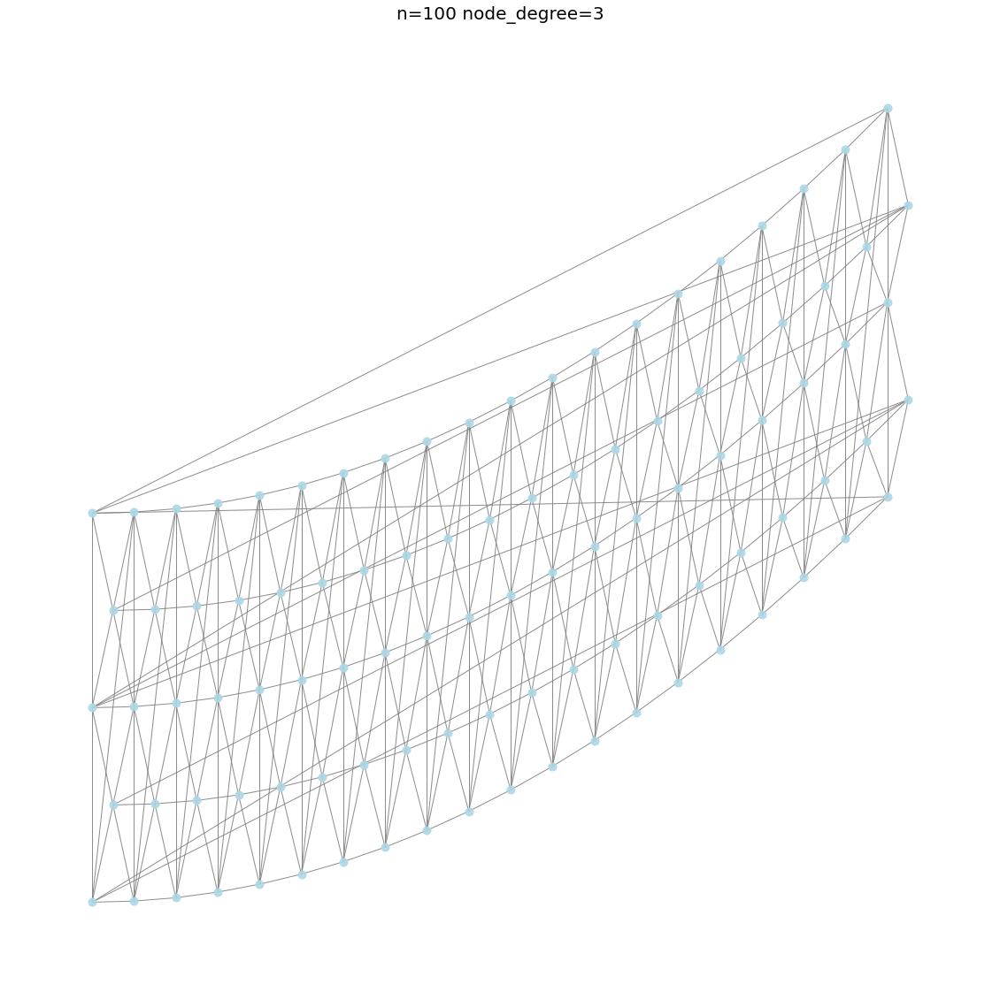

In [ ]:
fig,ax=plt.subplots(1,1,figsize=(20,20))
graf,pos = create_lattice(5,39,6,periodic=True)
print(len(graf.nodes))
plot_network(graf,pos,ax,"n=100 node_degree=3")

200


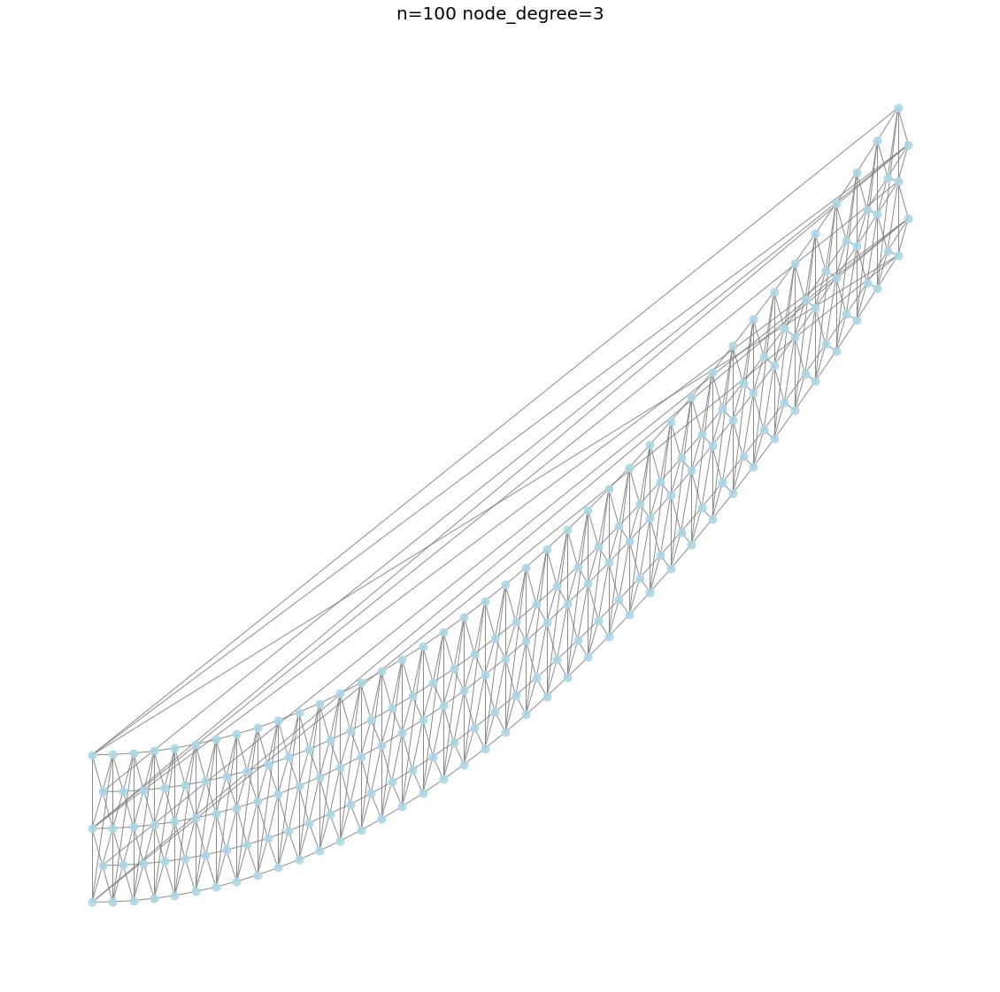

In [ ]:
fig,ax=plt.subplots(1,1,figsize=(20,20))
graf,pos = create_lattice(5,79,6,periodic=True)
print(len(graf.nodes))
plot_network(graf,pos,ax,"n=100 node_degree=3")

In [ ]:
avg_list = []
for i in range(100):
    g,pos = create_lattice(9,18,6)
    avg = sum(dict(g.degree(g.nodes)).values())/len(g.nodes)
    avg_list.append(avg)
print("Rata-rata degree dari 1000 graf (small world network):",sum(avg_list)/100)

Rata-rata degree dari 1000 graf (small world network): 5.220000000000014


In [ ]:
graf,pos = create_lattice(9,18,6)
print(len(graf.nodes))
graf,pos = create_lattice(19,18,6)
print(len(graf.nodes))

100
200


In [ ]:
# fig,ax=plt.subplots(1,1,figsize=(20,20))
graf,pos = create_lattice(2,16,3)
# plot_network(graf,pos,ax,"n=100 node_degree=3")
for i in range(3,100,2):
    for j in range(5,100,2):
        graf,pos = create_random_network(100,)
        n = len(graf.nodes)
        if n == 100:
            print(i,j,"Nemuuuuuuu","100")
        if n == 200:
            print(len(graf.nodes))
            print(i,j,"Nemuuuuuuu","200")

#BoxPlot & Heatmap

In [ ]:
import threading
import time
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

def get_max_infected(graph,pos,inf_rate,i,result):
    list_max_infected = []
    for j in range(100):
        model = NetworkInfectionModel(graph,pos,inf_rate)
        for k in range(200):
            model.step()
        df = get_column_data(model)
        list_max_infected.append(df['Infected'].max())
    result[i]=list_max_infected


def get_max_infected_for_heatmap_max(graph,pos,inf_rate,i,row):
    list_max_infected = []
    for j in range(100):
        model = NetworkInfectionModel(graph,pos,inf_rate)
        for k in range(200):
            model.step()
        df = get_column_data(model)
        list_max_infected.append(df['Infected'].max())
    row[i]=round(max(list_max_infected),2)

def get_max_infected_for_heatmap_avg(graph,pos,inf_rate,i,row):
    list_max_infected = []
    for j in range(100):
        model = NetworkInfectionModel(graph,pos,inf_rate)
        for k in range(200):
            model.step()
        df = get_column_data(model)
        list_max_infected.append(df['Infected'].max())
    row[i]=round(np.mean(list_max_infected),2)

def plot_infected_vs_degree(n,create_network,list_k,inf_rate,title):
    l_k = len(list_k)
    all_max = [None]*l_k
    t_list = []
    # fig,axes=plt.subplots(l_k,l_k,figsize=(30*l_k+10,15*l_k))
    fig,ax=plt.subplots(figsize=(10,7))
    for k in range(l_k):
        graph,pos = create_network(n,list_k[k])
        t = threading.Thread(target=get_max_infected,args=(graph,pos,inf_rate,k,all_max))
        t_list.append(t)
        t.start()
    for t in t_list: t.join()
    ax.boxplot(all_max)
    ax.set_xticklabels(list_k)
    ax.set_title(title,fontsize=15)
    ax.set_ylabel('Infected')
    ax.set_xlabel('Degree')
    ax.set_ylim([0, 100])

def plot_heat_data_max(n,create_network,list_k,list_inf_rate,title):
    table = []
    for k in list_k:
        row = [None]*len(list_inf_rate)
        t_list = []
        for i in range(len(list_inf_rate)):
            graph,pos = create_network(n,k)
#             print(list_inf_rate,i,row)
            t = threading.Thread(target=get_max_infected_for_heatmap_max,args=(graph,pos,list_inf_rate[i],i,row))
            t_list.append(t)
            t.start()
        for t in t_list: t.join()
        print(row)
        table.append(row)
    fig,ax = plt.subplots(figsize=(9,7))
    ax = sns.heatmap( table , linewidth = 0.5 ,annot = True, cmap = 'coolwarm',fmt='g' )
    plt.title(title)
    ax.set_ylabel('Degree')
    ax.set_xlabel('Infection_rate')
    ax.set_xticklabels(list_inf_rate)
    ax.set_yticklabels(list_k)
    plt.show()

def plot_heat_data_mean(n,create_network,list_k,list_inf_rate,title):
    table = []
    for k in list_k:
        row = [None]*len(list_inf_rate)
        t_list = []
        for i in range(len(list_inf_rate)):
            graph,pos = create_network(n,k)
#             print(list_inf_rate,i,row)
            t = threading.Thread(target=get_max_infected_for_heatmap_mean,args=(graph,pos,list_inf_rate[i],i,row))
            t_list.append(t)
            t.start()
        for t in t_list: t.join()
        print(row)
        table.append(row)
    fig,ax = plt.subplots(figsize=(9,7))
    ax = sns.heatmap( table , linewidth = 0.5 ,annot = True, cmap = 'coolwarm' ,fmt='g')
    plt.title(title)
    ax.set_ylabel('Degree')
    ax.set_xlabel('Infection_rate')
    ax.set_xticklabels(list_inf_rate)
    ax.set_yticklabels(list_k)
    plt.show()

In [ ]:
def get_max_infected_for_heatmap_thread(graph,pos,inf_rate,k,i,row,stat='max'):
    global start_time
    list_max_infected = []
    for j in range(100):
        model = NetworkInfectionModel(graph,pos,inf_rate)
        for l in range(200):
            model.step()
        df = get_column_data(model)
        list_max_infected.append(df['Infected'].max())
    if stat == 'mean':
        row[i]=round(np.mean(list_max_infected),2)
    else:
        row[i]=round(max(list_max_infected),2)
    print(f"get_data network k={k} inf_rate={inf_rate} END at {time.time()-start_time}s = {(time.time()-start_time)/60}m")

def get_row_thread(n,create_network,k,list_inf_rate,table,index,stat='max'):
    global start_time
    row = [None]*len(list_inf_rate)
    t_list = []
    for i in range(len(list_inf_rate)):
        graph,pos = create_network(n,k)
        t = threading.Thread(target=get_max_infected_for_heatmap_thread,args=(graph,pos,list_inf_rate[i],k,i,row,stat))
        t_list.append(t)
        t.start()
        print(f"get_data network k={k} inf_rate={list_inf_rate[i]} START at {time.time()-start_time}s = {(time.time()-start_time)/60}m")
    for t in t_list:
        t.join()
    table[index] = row
    print(f"get_row_data network k={k}  END at {time.time()-start_time}s = {(time.time()-start_time)/60}m")
    print(k," | ",row)

def plot_heat_data_thread(n,create_network,list_k,list_inf_rate,title,stat='max'):
    global start_time
    table = [None]*len(list_k)
    t_list = []
    for i in range(len(list_k)):
        t = threading.Thread(target=get_row_thread,args=(n,create_network,list_k[i],list_inf_rate,table,i,stat))
        t_list.append(t)
        t.start()
        print(f"get_row_data network k={list_k[i]}  START at {time.time()-start_time}s = {(time.time()-start_time)/60}m")
    for t in t_list:
        t.join()
    print(f"Finished collected all data at {time.time()-start_time}s = {(time.time()-start_time)/60}m")
    fig,ax = plt.subplots(figsize=(9,7))
    ax = sns.heatmap( table , linewidth = 0.5 ,annot = True, cmap = 'coolwarm',fmt='g' )
    plt.title(title)
    ax.set_ylabel('Degree')
    ax.set_xlabel('Infection_rate')
    ax.set_xticklabels(list_inf_rate)
    ax.set_yticklabels(list_k)
    plt.show()
    print(f"Finished create diagram at {time.time()-start_time}s = {(time.time()-start_time)/60}m")


In [ ]:
import time

s = time.time()
print(s)
time.sleep(1)
e = time.time()
print(s,e,e-s)


1658378448.4498615
1658378448.4498615 1658378449.4520185 1.0021569728851318


## Heatmap Random Network

get_row_data network k=4  START at 0.006958484649658203s = 0.00011610190073649088m
get_row_data network k=3  START at 0.012790918350219727s = 0.00021334489186604819m
get_row_data network k=2  START at 0.024699687957763672s = 0.0004118243853251139m
get_data network k=2 inf_rate=0.1 START at 1.0748023986816406s = 0.017913452784220376m
get_data network k=3 inf_rate=0.1 START at 1.394129753112793s = 0.023235583305358888m
get_data network k=4 inf_rate=0.1 START at 4.681516647338867s = 0.0780253291130066m
get_data network k=2 inf_rate=0.2 START at 5.2629234790802s = 0.08771545886993408m
get_data network k=3 inf_rate=0.2 START at 13.652814865112305s = 0.2275470018386841m
get_data network k=4 inf_rate=0.2 START at 18.482543468475342s = 0.3080424706141154m
get_data network k=2 inf_rate=0.3 START at 22.34780478477478s = 0.37246349652608235m
get_data network k=3 inf_rate=0.3 START at 32.11758494377136s = 0.535293165842692m
get_data network k=4 inf_rate=0.3 START at 44.73580884933472s = 0.74559688

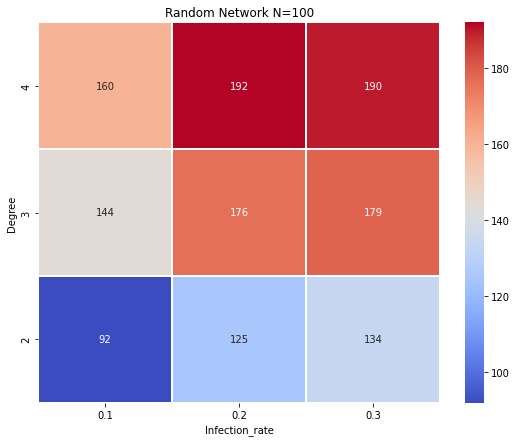

Finished create diagram at 215.9435999393463s = 3.5990601579348245m


In [ ]:
# plot_heat_data_max(500,create_random_network,[4,8],[round(i,1) for i in np.arange(0.1,1.1,0.1)],"Heatmap Max - Random Network N=100")
start_time = time.time()
plot_heat_data_thread(200,create_random_network,[4,3,2],[0.1,0.2,0.3],"Random Network N=100","max")


In [ ]:


def get_max_infected_for_heatmap(graph,pos,inf_rate,k,stat='max'):
    list_max_infected = []
    for j in range(100):
        model = NetworkInfectionModel(graph,pos,inf_rate)
        for k in range(200):
            model.step()
        df = get_column_data(model)
        list_max_infected.append(df['Infected'].max())
    if stat == 'mean':
        return round(np.mean(list_max_infected),2)
    else:
        return round(max(list_max_infected),2)




def plot_heat_data(n,create_network,list_k,list_inf_rate,title,stat='max'):
    global start_time
    table = []
    for k in list_k:
        row = []
        print(f"get_row_data network k={k}  START at {time.time()-start_time}s = {(time.time()-start_time)/60}m")
        for i in range(len(list_inf_rate)):
            graph,pos = create_network(n,k)
            print(f"get_data network k={k} inf_rate={list_inf_rate[i]} start at {time.time()-start_time}s = {(time.time()-start_time)/60}m")
            row.append(get_max_infected_for_heatmap(graph,pos,list_inf_rate[i],stat))
            print(f"get_data network k={k} inf_rate={list_inf_rate[i]} END at {time.time()-start_time}s = {(time.time()-start_time)/60}m")
        table.append(row)
        print(f"get_row_data network k={k}  END at {time.time()-start_time}s = {(time.time()-start_time)/60}m")
    print(f"Finished collected all data at {time.time()-start_time}s = {(time.time()-start_time)/60}m")
    fig,ax = plt.subplots(figsize=(9,7))
    ax = sns.heatmap( table , linewidth = 0.5 ,annot = True, cmap = 'coolwarm' ,fmt='g')
    plt.title(title)
    ax.set_ylabel('Degree')
    ax.set_xlabel('Infection_rate')
    ax.set_xticklabels(list_inf_rate)
    ax.set_yticklabels(list_k)
    plt.show()
    print(f"Finished create diagram at {time.time()-start_time}s = {(time.time()-start_time)/60}m")


get_row_data network k=4  START at 6.961822509765625e-05s = 1.442432403564453e-06m
get_data network k=4 inf_rate=0.1 start at 0.8701355457305908s = 0.014502358436584473m
get_data network k=4 inf_rate=0.1 END at 23.4494047164917s = 0.3908234596252441m
get_data network k=4 inf_rate=0.2 start at 24.502306699752808s = 0.40837185780207313m
get_data network k=4 inf_rate=0.2 END at 52.663630962371826s = 0.8777272423108419m
get_data network k=4 inf_rate=0.3 start at 53.30817246437073s = 0.8884696125984192m
get_data network k=4 inf_rate=0.3 END at 75.87620425224304s = 1.2646034558614094m
get_row_data network k=4  END at 75.8771116733551s = 1.2646185954411824m
get_row_data network k=3  START at 75.87746167182922s = 1.2646244049072266m
get_data network k=3 inf_rate=0.1 start at 76.48039436340332s = 1.274673302968343m
get_data network k=3 inf_rate=0.1 END at 97.19305872917175s = 1.6198843677838644m
get_data network k=3 inf_rate=0.2 start at 97.82726502418518s = 1.6304544806480408m
get_data network

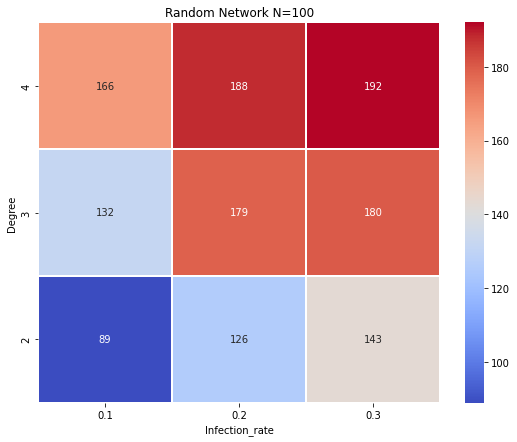

Finished create diagram at 206.5904848575592s = 3.443174894650777m


In [ ]:
# plot_heat_data_max(500,create_random_network,[4,8],[round(i,1) for i in np.arange(0.1,1.1,0.1)],"Heatmap Max - Random Network N=100")
start_time = time.time()
plot_heat_data(200,create_random_network,[4,3,2],[0.1,0.2,0.3],"Random Network N=100","max")